# OCR Projeto 02: Escaneamento de imagem

In [4]:
try:
    import google.colab
    IN_COLAB = True
    print("Executando no Google Colab")
except ImportError:
    IN_COLAB = False
    print("Não executando no Google Colab")

Não executando no Google Colab


# Importando as bibliotecas

In [5]:
import numpy as np
import cv2
if IN_COLAB:
    from google.colab.patches import cv2_imshow
else:
    %pip install imutils==0.5.4
import imutils
from matplotlib import pyplot as plt

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


# Baixando as imagens  e fontes para o Projeto

In [6]:
if IN_COLAB:
    # Baixar imagens para o laboratório.
    !wget https://github.com/fabiobento/ocr-sis-emb-2024-2/raw/refs/heads/main/imagens.zip
    !unzip -n -q imagens.zip
    
    # Baixar fontes para o laboratório
    !wget https://github.com/fabiobento/ocr-sis-emb-2024-2/raw/refs/heads/main/fontes.zip
    !unzip -n -q fontes.zip    

In [7]:
def mostrar(img):
  fig = plt.gcf()
  fig.set_size_inches(20, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()

# Processamentos na imagem (para transformação)

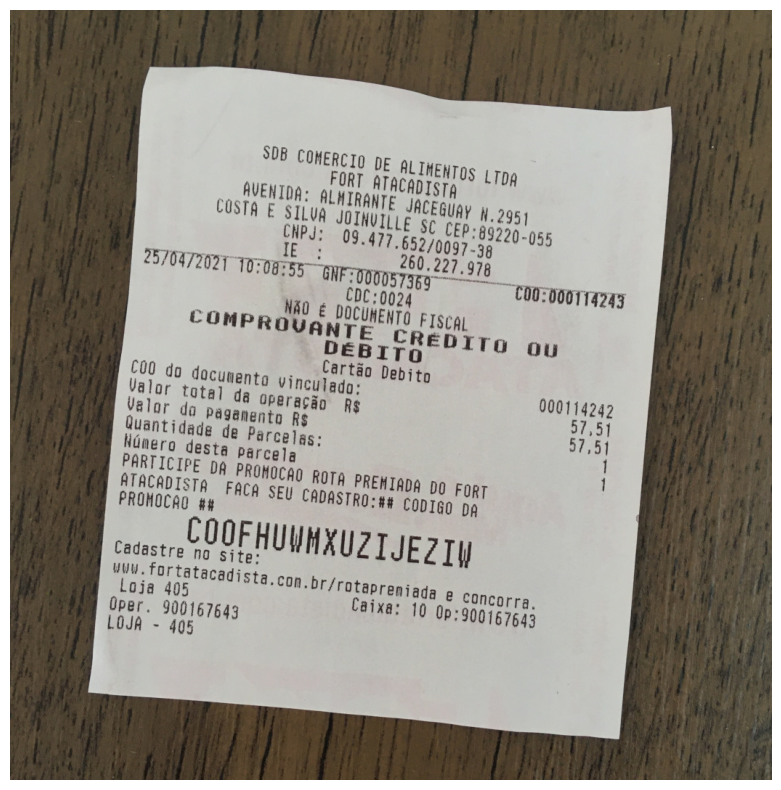

1061 1049


In [14]:
img = cv2.imread('./Imagens/Imagens-Projeto-2/doc_rotacionado01.jpg')
original = img.copy()
mostrar(img)
(H, W) = img.shape[:2]
print(H, W)

## Conversão para tons de cinza (*grayscale*)

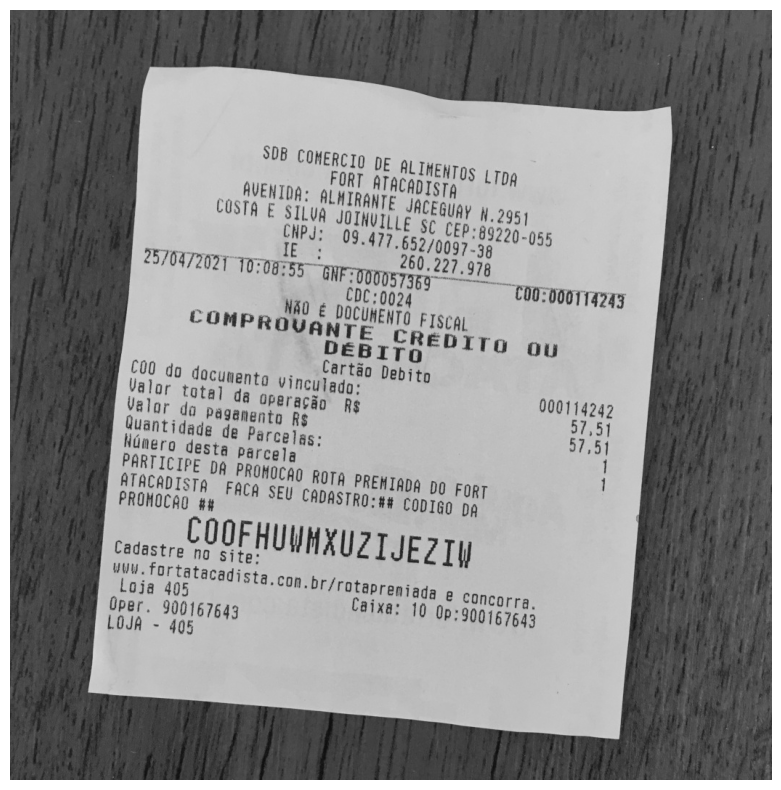

In [15]:
# INÍCIO DE SEU CÓDIGO
# Insira abaixo a função dO OpenCV que converte uma imagem colorida no espaço de cores BGR
# para uma imagem em tons de cinza 
gray = XXXXXXX(img, cv2.COLOR_BGR2GRAY)
# FIM DE SEU CÓDIGO
mostrar(gray)

## Aplicação de desfoque (*Gaussian Blur*)

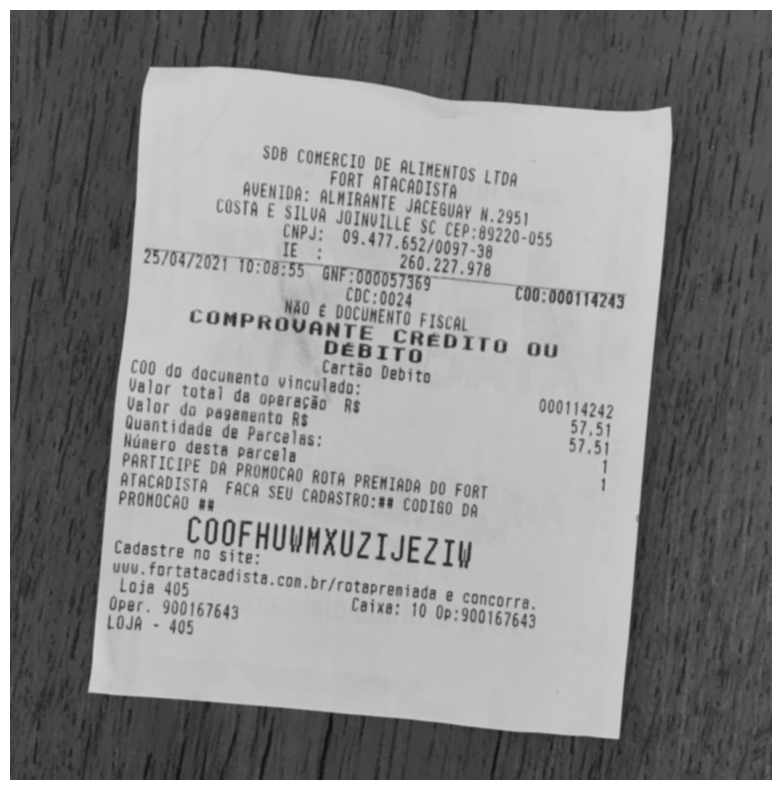

In [16]:
# INÍCIO DE SEU CÓDIGO
# Insira abaixo a função do OpenCV que faz desfoque Gaussiano para suazivar a imagem
blur = XXXXX(gray, (5, 5), 0)
# FIM DE SEU CÓDIGO
mostrar(blur)

## Detecção de bordas (*Canny Edge*)

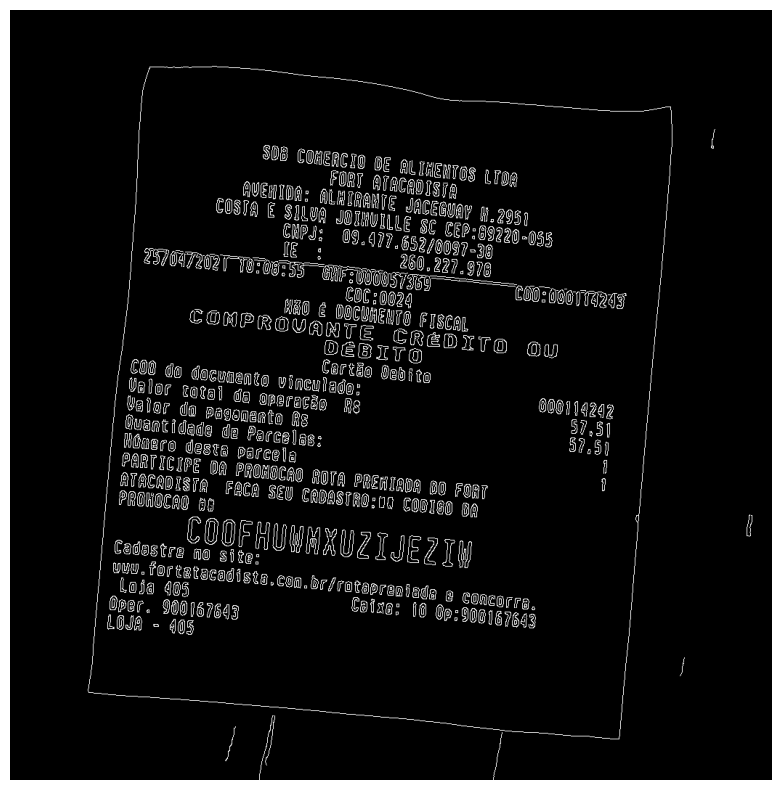

In [17]:
# INÍCIO DO SEU CÓDIGO
# Insira aplica a função do OpenCV que implementa o algoritmo de detecção de bordas de Canny
# à imagem suavizada (ou qualquer imagem de entrada).
# Esse algoritmo é amplamente utilizado para identificar bordas em imagens,
# destacando áreas de transição rápida de intensidade (como as bordas de objetos).
edged = XXXXX(blur, 60, 160)
# FIM DO SEU CÒDIGO
mostrar(edged)

# Detecção de contornos na imagem

In [18]:
# INÍCIO DO SEU CÓDIGO
def encontrar_contornos(img):
  # Use abaixo um função do Open CV que encontra os contornos na imagem binária (onde as bordas já
  # foram destacadas, geralmente após a aplicação de cv2.Canny ou threshold)
# FIM DO SEU CÓDIGO  
  conts = XXXXXXXXXX(img, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
  conts = imutils.grab_contours(conts)
  conts = sorted(conts, key = cv2.contourArea, reverse = True)[:6]
  return conts


In [19]:
conts = encontrar_contornos(edged.copy())

In [ ]:
conts

## Implemente o algoritmo de Ramer–Douglas–Peucke para localiza o maior contorno

- Douglas-Peucker: http://en.wikipedia.org/wiki/Ramer-Douglas-Peucker_algorithm:
    - Seu código deve implementar uma parte do algoritmo de Ramer–Douglas–Peucker, que é utilizado para simplificar curvas ou contornos poligonais.
    - Neste caso específico, o algoritmo está sendo aplicado para detectar contornos que são aproximadamente quadriláteros (com 4 vértices).

In [21]:
# INÍCIO DE SEU CÓDIGO

# 1°) Iteração pelos contornos (for c in conts):
#O código começa iterando sobre todos os contornos encontrados previamente, armazenados
# na variável conts. Para cada contorno c, ele aplica o processo de simplificação.
for c in conts:
# 2º) Calcular o perímetro do contorno
# Utilize uma função do OpenCV que calcule o comprimento do perímetro do contorno c.
# O segundo argumento (True) indica que o contorno é uma forma fechada (isto é, ele forma um laço).
# Essa medida de perímetro será usada para ajustar a precisão da aproximação poligonal.    
  perimetro = XXXXXXXX(c, True)
# 3º) Aplique o algoritmo de simplificação de contornos
# Utilize a função do OpenCV que aplica o algoritmo de Ramer–Douglas–Peucker para simplificar
# o contorno. Aqui, o parâmetro mais importante é 0.02 * perimetro,
# que define a precisão da simplificação.
# Quanto maior esse valor, maior a tolerância para simplificar o contorno.
# Neste caso, é usada uma tolerância de 2% do perímetro total do contorno. 
# O argumento True indica novamente que o contorno é fechado.
  aproximacao = XXXXXX(c, 0.02 * perimetro, True)
# 4°) Verificar se o contorno tem 4 vértices:    
  if len(aproximacao) == 4:
    # Quando um contorno com 4 vértices é encontrado, ele é armazenado na variável maior
    # e o laço é interrompido com o break. Isso significa que o código só procura
    # o primeiro quadrilátero detectado e não continua verificando outros contornos.
    maior = aproximacao
    break

# FIM DE SEU CÓDIGO

In [ ]:
maior

array([[[ 192,   78]],

       [[ 108,  940]],

       [[ 838, 1004]],

       [[ 909,  133]]], dtype=int32)

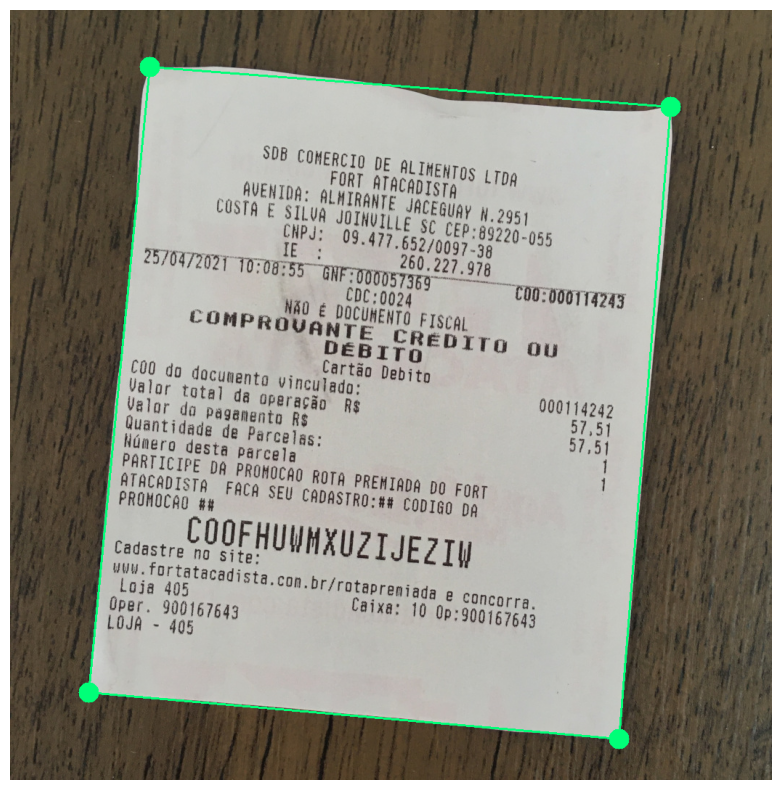

In [22]:
cv2.drawContours(img, maior, -1, (120, 255, 0), 28)
cv2.drawContours(img, [maior], -1, (120, 255, 0), 2)
mostrar(img)

## Ordenando os pontos

Nós ja temos as 4 coordenadas x-y que correspondem aos cantos do retângulo/polígono localizado na imagem, porém esses pontos provavelmente estarão fora de uma ordem. Para fazer a transformação de perspectiva precisamos ordenar os pontos, de modo que eles fiquem em uma ordem padrão e assim seja possível aplicar a transformação.

É crucial que a ordem dos pontos do retângulo esteja consistente em todo o programa. Pois caso mude de ordem algum desses pontos a transformação não vai ficar da forma que queremos.

Nós escolhemos essa ordem:

1. **te** = topo esquerdo (superior esquerdo)
2. **td** = topo direito (superior direito)
3. **bd** = baixo direito (inferior direito)
4. **be** = baixo esquerdo (inferior esquerdo)

Preferimos deixar nessa ordem por ser um padrão mais utilizado. Você poderia se quiser mudar a ordem, deixar por exemplo `be` antes de `bd` e após `td`, só que se for fazer assim precisa manter essa ordem no restante do programa (especificamente na parte do pts2 que veremos abaixo, trocando o [W, H] por [0, H])

In [23]:
def ordenar_pontos(pontos):
  pontos = pontos.reshape((4,2))
  pontos_novos = np.zeros((4, 1, 2), dtype=np.int32)

  add = pontos.sum(1)
  pontos_novos[0] = pontos[np.argmin(add)]
  pontos_novos[2] = pontos[np.argmax(add)]

  dif = np.diff(pontos, axis = 1)
  pontos_novos[1] = pontos[np.argmin(dif)]
  pontos_novos[3] = pontos[np.argmax(dif)]

  return pontos_novos

In [24]:
pontos_maior = ordenar_pontos(maior)
print(pontos_maior)

[[[ 192   78]]

 [[ 909  133]]

 [[ 838 1004]]

 [[ 108  940]]]


In [25]:
maior

array([[[ 192,   78]],

       [[ 108,  940]],

       [[ 838, 1004]],

       [[ 909,  133]]], dtype=int32)

## Obtenção da matriz de transformação

In [26]:
pts1 = np.float32(pontos_maior)

In [27]:
pts1

array([[[ 192.,   78.]],

       [[ 909.,  133.]],

       [[ 838., 1004.]],

       [[ 108.,  940.]]], dtype=float32)

In [28]:
print(H, W)

1061 1049


In [29]:
pts2 = np.float32([[0,0], [W, 0], [W, H], [0, H]])

In [30]:
# INCÍCIO DE SEU CÓDIGO
# Insire que a função do OpenCV que calcula a matriz de transformação de perspectiva (ou homografia)
# que mapeia pontos de uma imagem para outra, permitindo transformar uma região de uma
# imagem para uma nova perspectiva.
matriz = XXXXXXXXX(pts1, pts2)
matriz
# FIM DE SEU CÓDIGO

array([[ 1.47103022e+00,  1.43348652e-01, -2.93618997e+02],
       [-9.58731834e-02,  1.24983768e+00, -7.90796880e+01],
       [ 1.08773828e-05,  2.32288006e-05,  1.00000000e+00]])

## Transformação de perspectiva

In [31]:
# INÍCIO DE SEU CÓDIGO
# Insira a função do OpenCV utilizada para aplicar uma transformação de perspectiva em uma imagem,
# utilizando uma matriz de transformação previamente calculada. 
transform = XXXXXXXX(original, matriz, (W, H))
# FIM DE SEU CÓDIGO

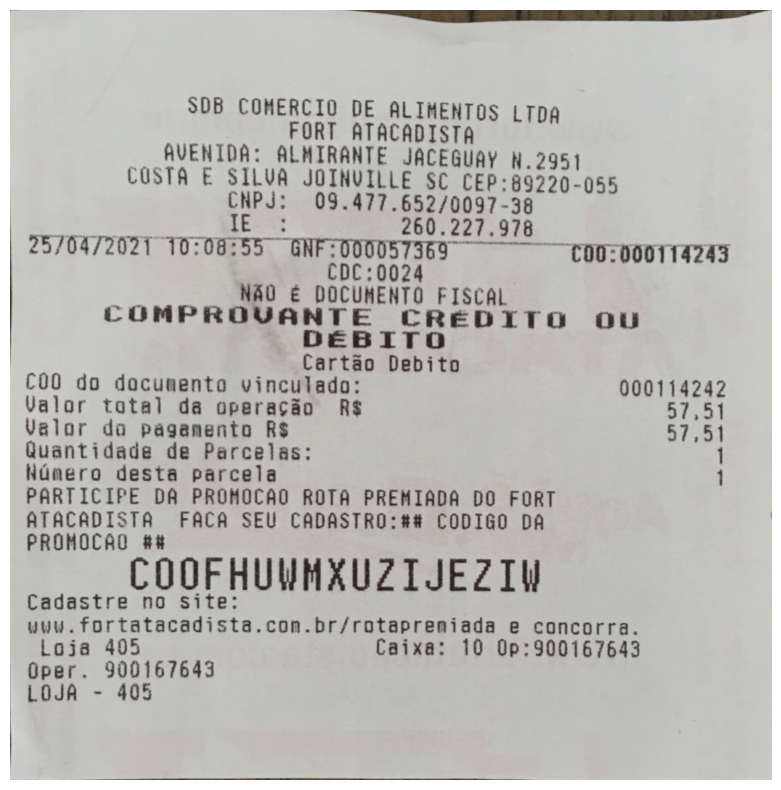

In [32]:
mostrar(transform)

# OCR com Tesseract

In [34]:
!sudo apt update
!sudo apt install -y tesseract-ocr
%pip install pytesseract
!apt-get install tesseract-ocr-por

Hit:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:2 http://archive.ubuntu.com/ubuntu jammy InRelease                         
Hit:3 http://security.ubuntu.com/ubuntu jammy-security InRelease               
Hit:4 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
60 packages can be upgraded. Run 'apt list --upgradable' to see them.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 60 not upgraded.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
E: Could not open lock file /var/lib/dpkg/lock-frontend - open (13: Permission denied

In [35]:
!mkdir tessdata
!wget -O ./tessdata/por.traineddata https://github.com/tesseract-ocr/tessdata/blob/main/por.traineddata?raw=true

mkdir: cannot create directory ‘tessdata’: File exists
--2024-10-01 16:53:35--  https://github.com/tesseract-ocr/tessdata/blob/main/por.traineddata?raw=true
Resolving github.com (github.com)... 20.201.28.151
Connecting to github.com (github.com)|20.201.28.151|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/tesseract-ocr/tessdata/raw/refs/heads/main/por.traineddata [following]
--2024-10-01 16:53:36--  https://github.com/tesseract-ocr/tessdata/raw/refs/heads/main/por.traineddata
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/tesseract-ocr/tessdata/refs/heads/main/por.traineddata [following]
--2024-10-01 16:53:36--  https://raw.githubusercontent.com/tesseract-ocr/tessdata/refs/heads/main/por.traineddata
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.github

In [36]:
config_tesseract = "--tessdata-dir tessdata"
texto = pytesseract.image_to_string(transform, lang="por", config=config_tesseract)
print(texto)

SDB COMERCIO DE ALIMENTOS LTDA
FORT ATACADISTA
AVENIDA: ALMIRANTE JACEGUAY N.2951
COSTA E SILVA JOINUILLE SC CEP:89220-055
CNPJ: 09.477.652/0097-38
7 SRAm 260.227.978

2570972027 T0:08:55" Gnrzggvgãzgsà““““'** ***** CO0T0001142A3

NÃO É DOCUMENTO FISCAL
COMPROUANTE CREDITO OU

DÉBIT

Cartão Debito
COO do documento vinculado: 000114242
Valor total da operação R$ 55l
Valor do pagamento R$ BTAA
Quantidade de Parcelas:
Núnmnero desta parcela 1

PARTICIFE DA PROMOCAO ROTA PREMIADA DO FORT
ATACADISTA FACA SEU CADASTRO:%% CODIGO DA
PROMOCAO &%

COOFHUWMXUZIJEZIV

Cadastre no site:
uuu.fortatacadista.con.br/rotapreniada e concorra.
Loja 405 Caixa: 10 0p:900167643
Oper. 900167643
LOJA - 405

 



In [37]:
# INÍCIO DE SEU CÓDIGO
# Insira abaixo a função do OpenCV para redimensionar uma imagem
maior = XXXXXX(transform, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
# FIM DE SEU CÓDIGO
texto = pytesseract.image_to_string(maior, lang="por", config=config_tesseract)
print(texto)

SDB COMERCIO DE ALIMENTOS LTDA
FORT ATACADISTA
AVENIDA: ALMIRANTE JACEGUAY N.2951

COSTA E SILVA JOINVILLE SC CEP:89220-055

CNPJ: 09.477.652/0097-38
RAA A cA uA

zwmnm1mmms*wíª%g?r“ TU0 000114283
NÃO É DOCUMENTO FISCAL

COMPROVANTE CRÉDITO OU

DÉEBITO

Cartão Debito
C0OO0 do documento vincutado: 000114242
Valor total da operação R$ BT
Valor do pagamento R$ BTA
Quantidade de Parcelas: 1
Número desta parcela 1

PARTICIPE DA PROMOCAO ROTA PREMIADA DO FORT
ATACADISTA FACA SEU CADASTRO:&%&% CODIGO DA
PROMOCÃAO k%

COOFHUWMXUZIJEZIMV

Cadastre no site:
uuuw.fortatacadista.con.br/rotaprenmniada e concorra.
Loja 405 Caixa: 10 0p:900167643
Oper. 900167643
LOJA - 405



# Melhoria na qualidade da imagem

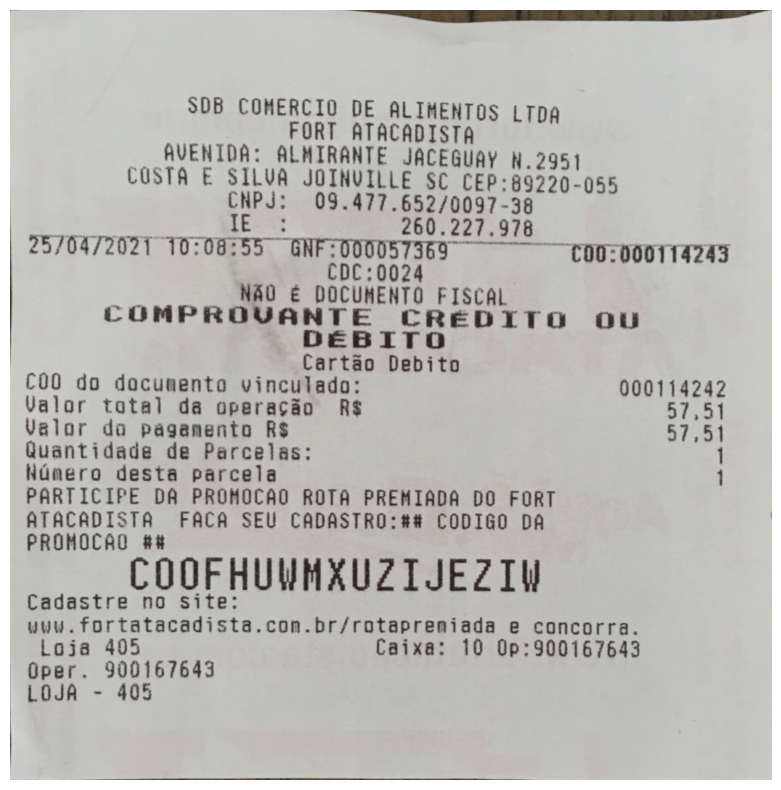

In [38]:
mostrar(transform)

In [39]:
transform.shape

(1061, 1049, 3)

## Aumentando o contraste e brilho

In [40]:
brilho = 50
contraste = 80
ajustes = np.int16(transform)
ajustes.shape

(1061, 1049, 3)

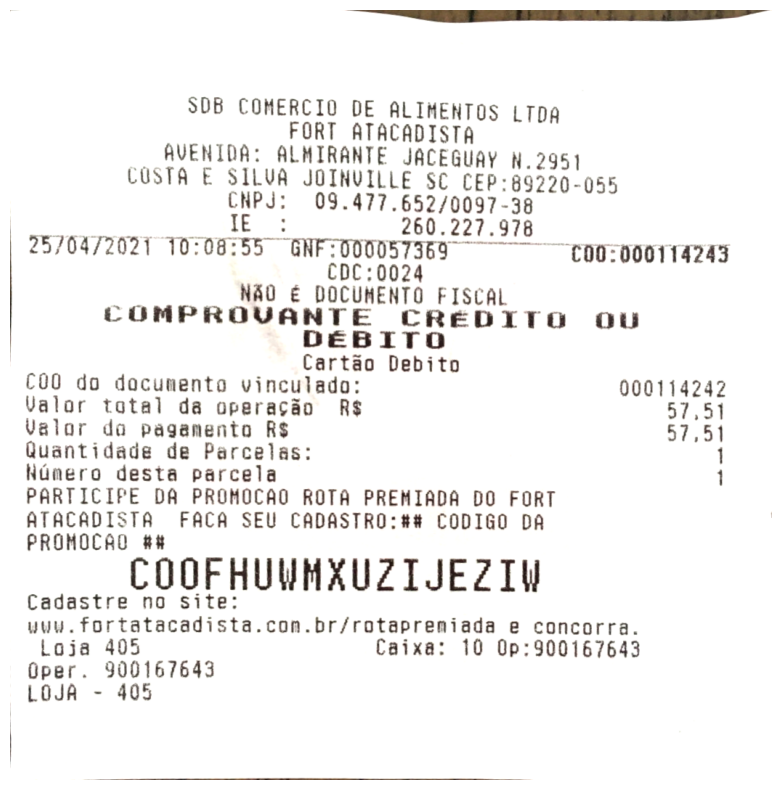

In [41]:
ajustes = ajustes * (contraste / 127 + 1) - contraste + brilho
ajustes = np.clip(ajustes, 0, 255)
ajustes = np.uint8(ajustes)
mostrar(ajustes)

## Limiarização Adaptativa

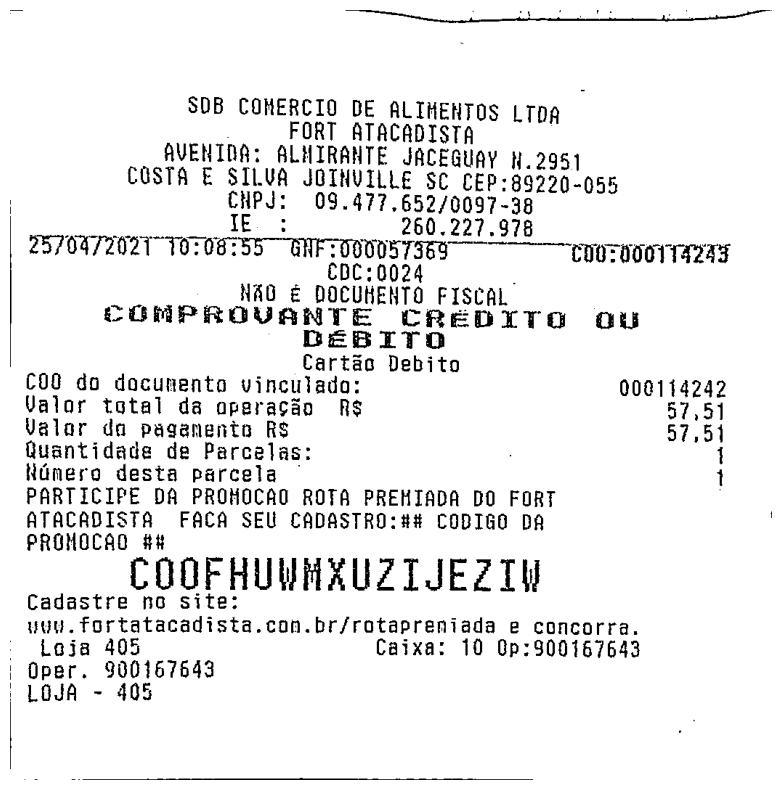

In [42]:
img_process = cv2.cvtColor(transform, cv2.COLOR_BGR2GRAY)
# INÍCIO DE SEU CÓDIGO
# Insira a função do OpenCV que aplica um processamento de imagem conhecido como thresholding adaptativo.
# Para cnverter a imagem em uma imagem binária, onde cada pixel é avaliado em relação à média
# dos pixels em sua vizinhança.
# Isso é útil em imagens com iluminação desigual, pois permite que o limiar se ajuste localmente.
img_process = XXXXXX(img_process, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
# FIM DE SEU CÓDIGO
mostrar(img_process)

## Remoção de bordas

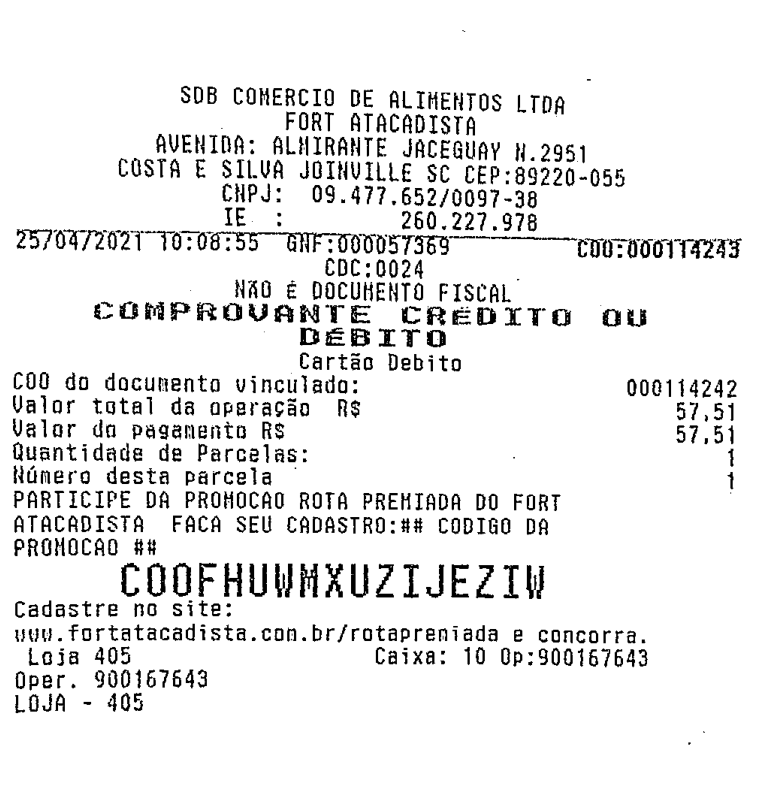

In [43]:
margem = 18
img_final = img_process[margem:H - margem, margem:W - margem]
mostrar(img_final)

## Comparativo

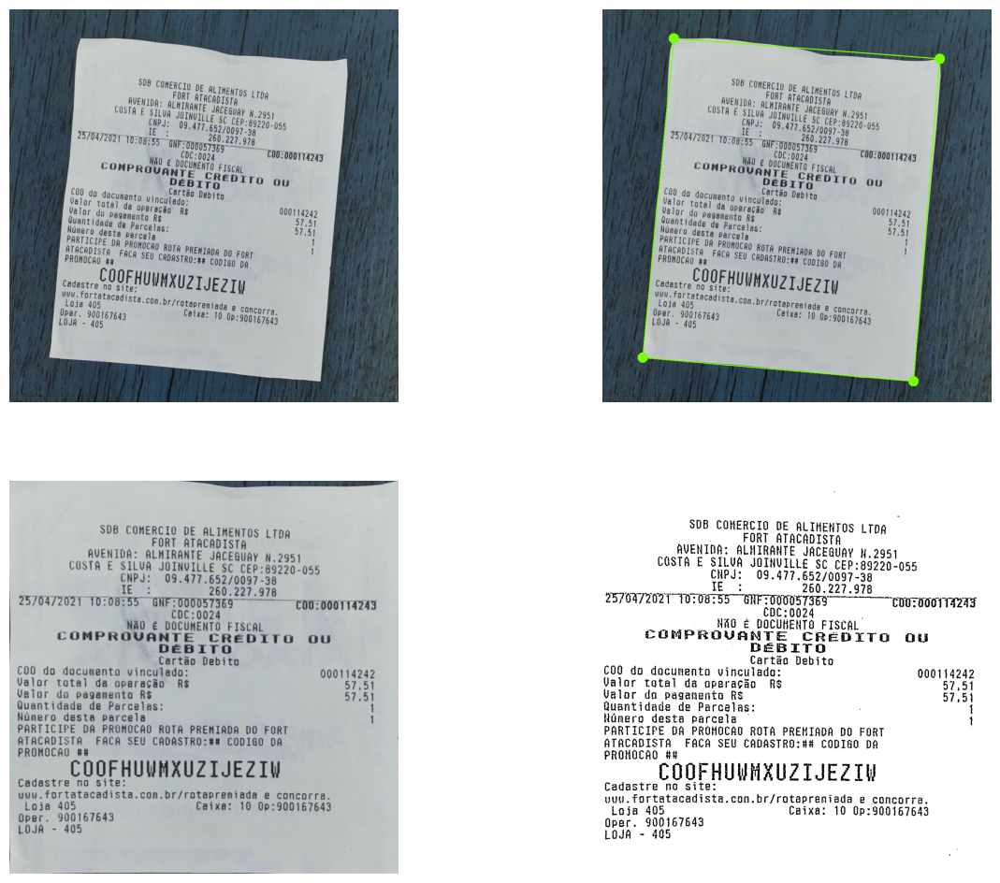

In [44]:
fig, im = plt.subplots(2, 2, figsize=(15,12))
for x in range(2):
  for y in range(2):
    im[x][y].axis('off')

im[0][0].imshow(original)
im[0][1].imshow(img)
im[1][0].imshow(transform, cmap='gray')
im[1][1].imshow(img_final, cmap='gray')
plt.show()

# Unindo as funções

In [45]:
def transform_imagem(nome_imagem):
  img = cv2.imread(nome_imagem)
  original = img.copy()
  mostrar(img)
  (H, W) = img.shape[:2]

  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray, (7, 7), 0)
  edged = cv2.Canny(blur, 60, 160)
  mostrar(edged)
  conts = encontrar_contornos(edged.copy())
  for c in conts:
    peri = cv2.arcLength(c, True)
    aprox = cv2.approxPolyDP(c, 0.02 * peri, True)

    if len(aprox) == 4:
      maior = aprox
      break

  cv2.drawContours(img, maior, -1, (120, 255, 0), 28)
  cv2.drawContours(img, [maior], -1, (120, 255, 0), 2)
  mostrar(img)

  pontosMaior = ordenar_pontos(maior)
  pts1 = np.float32(pontosMaior)
  pts2 = np.float32([[0, 0], [W, 0], [W, H], [0, H]])

  matriz = cv2.getPerspectiveTransform(pts1, pts2)
  transform = cv2.warpPerspective(original, matriz, (W, H))

  mostrar(transform)
  return transform


In [46]:
def processamento_img(img):
  img_process = cv2.resize(img, None, fx=1.6, fy=1.6, interpolation=cv2.INTER_CUBIC)
  img_process = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img_process = cv2.adaptiveThreshold(img_process, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
  return img_process

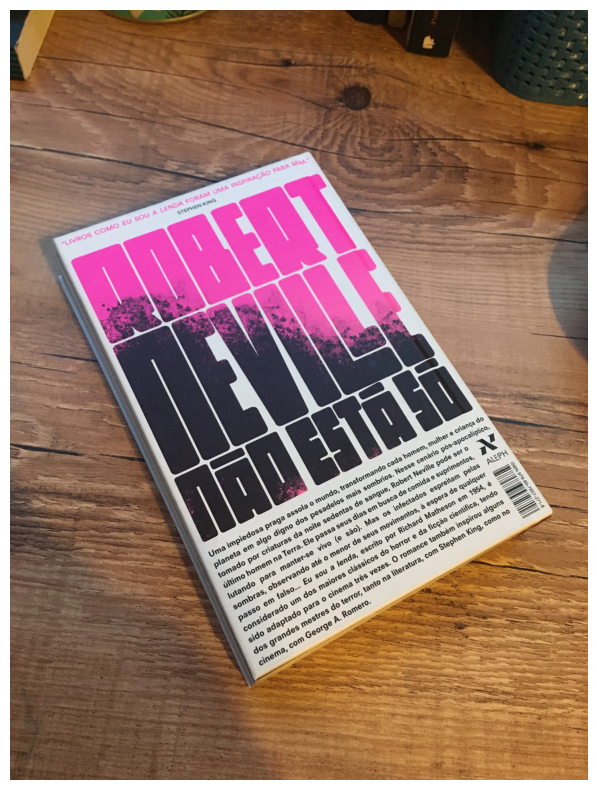

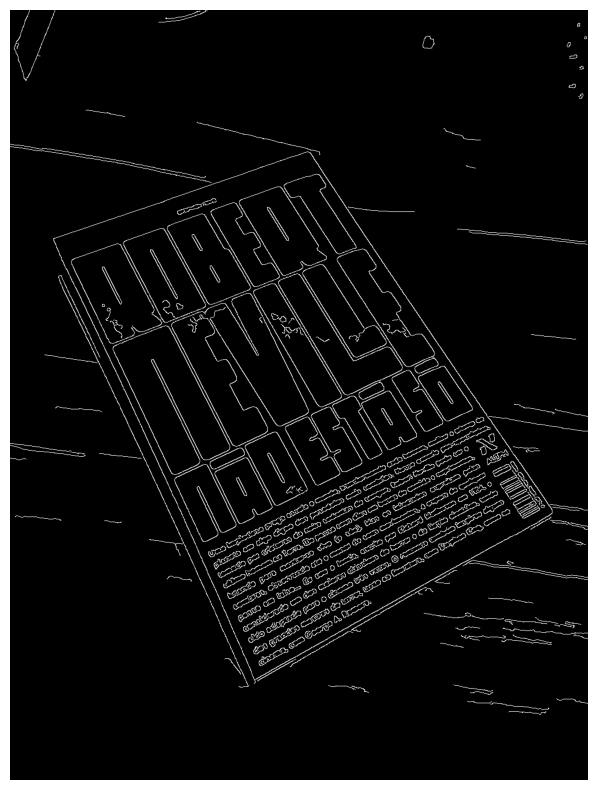

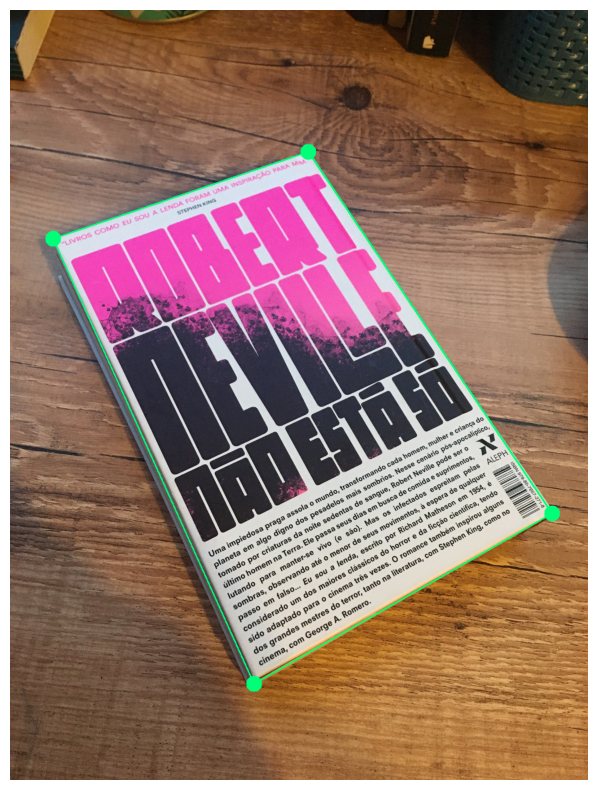

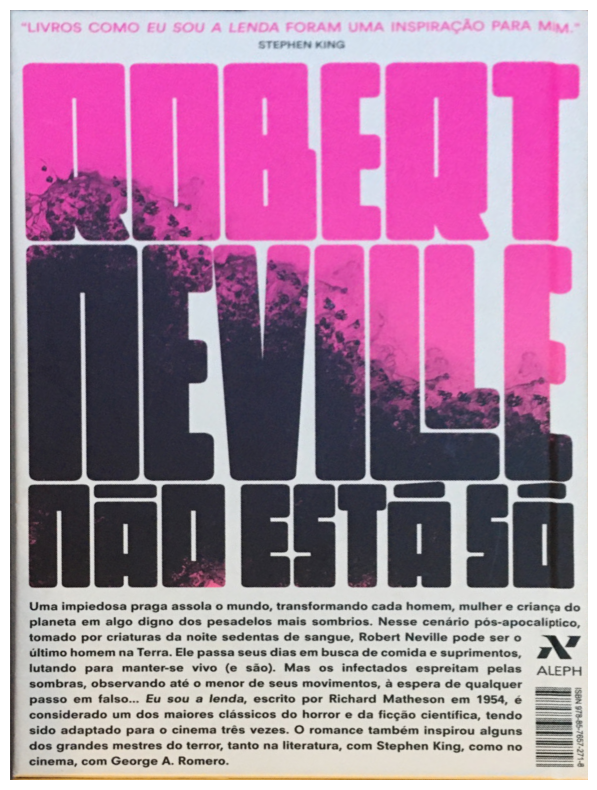

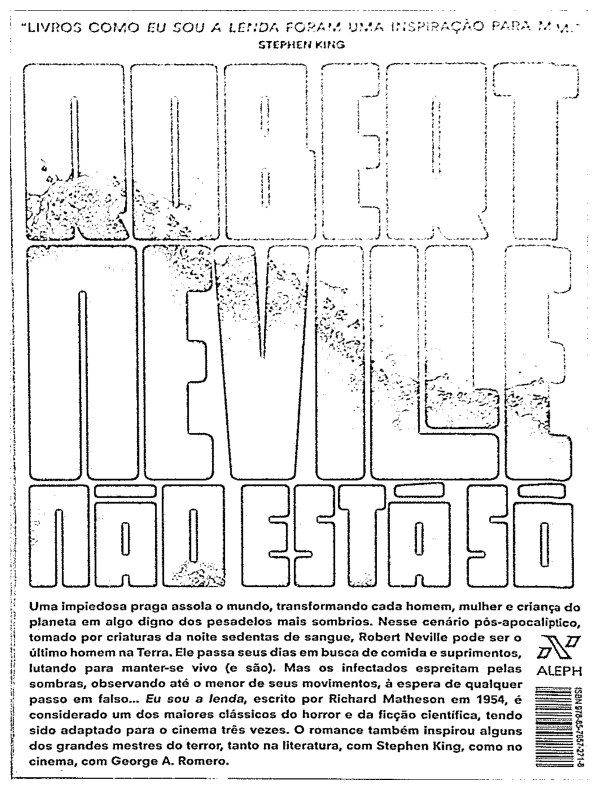

In [49]:
img = transform_imagem('./Imagens/Imagens-Projeto-2/livro_esal.jpg')
img_final = processamento_img(img)
mostrar(img_final)

In [50]:
texto = pytesseract.image_to_string(img_final, lang="por", config=config_tesseract)
print(texto)

"LIVROS COMO EU SOU & LENDA FGZA UNA
STEPHEN KING

   

PAÇÃO PARA Mic

 

  

Uma impiedosa praga assola o mundo, transformando cada homem, mulher e criança do
planeta em algo digno dos pesadelos mais sombrios. Nesse cenário pós-apocalíptico,
tomado por criaturas da noite sedentas de sangue, Robert Neville pode ser o 7
último homem na Terra. Ele passa seus dias em busca de comida e suprimentos, A
lutando para manter-se vivo (e são). Mas os infectados espreitam pelas ALEPH
sombras, observando até o menor de seus movimentos, à espera de qualquer
passo em falso... Eu sou a lenda, escrito por Richard Matheson em 1954, é
considerado um dos maiores clássicos do horror e da ficção científica, tendo
sido adaptado para o cinema três vezes. O romance também inspirou alguns
dos grandes mestres do terror, tanto na literatura, com Stephen King, como no
cinema, com George À. Romero.

- 69LS8 91 NES:

 

